In [ ]:
import cv2 as cv2
import matplotlib.pyplot as plt
import numpy as np

from tools import *
from my_functions_tp02 import *

In [ ]:
img=cv2.imread('/content/figs/car.png')

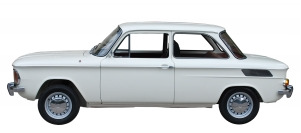

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
#To save this image specifying the file name and the image
cv2.imwrite("new_car.png",img)


True

In [ ]:
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
img=cv2.imread('/content/figs/flower.png')

gray_image= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

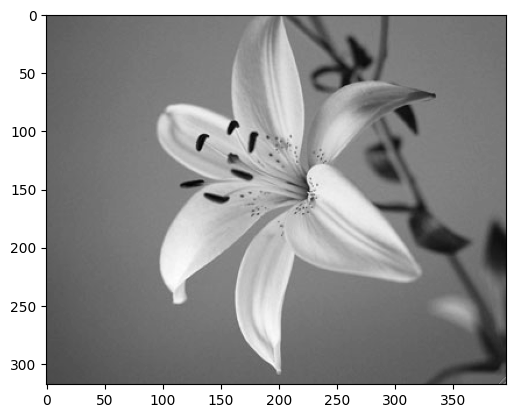

In [ ]:
plt.imshow(gray_image, cmap='gray')
plt.show()

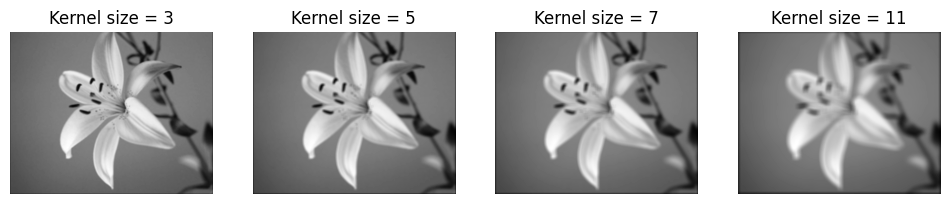

In [ ]:
k=[3, 5, 7, 11]
fig, axes = plt.subplots(1, 4, figsize=(12, 12))

for i, ax in zip(k, axes.flatten()):
   kernel = np.ones((i, i)) * 1/i*i
   filtred_im = Conv2D(add_padding(gray_image, ((i-1)//2, (i-1)//2)), kernel=kernel)
   ax.imshow(filtred_im, cmap='gray')
   ax.set_title(f'Kernel size = {i}')
   ax.axis('off')

plt.show()

In [ ]:
from skimage import color, io
# Preprocessing the image with the library of io
img_path = '/content/figs/flower.png'
img = io.imread(img_path)

# Converting to grayscale if the image is not already in grayscale
if len(img.shape) == 3:
    img = color.rgb2gray(img)

# Ensuring the image is in the correct data type
img = img.astype(np.float32)

Kernel size: 3, Padding: (1, 1)
Kernel size: 5, Padding: (2, 2)
Kernel size: 7, Padding: (3, 3)
Kernel size: 11, Padding: (5, 5)


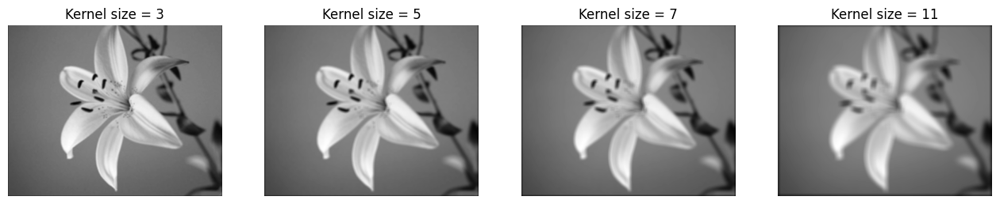

In [ ]:
# Example with the padding argument from Conv2D
# the kernel box containing the kernel sizes
k = [3, 5, 7, 11]
fig, axes = plt.subplots(1 , 4, figsize=(16, 16))

for i, ax in zip(k, axes.flatten()):
    kernel = np.ones((i, i)) * 1/(i*i)
    padding = ((i - 1) // 2, i // 2)  # Example padding calculation
    print(f"Kernel size: {i}, Padding: {padding}")
    filtred_im = Conv2D(img, padding=padding, kernel=kernel)
    ax.imshow(filtred_im, cmap='gray')
    ax.set_title(f'Kernel size = {i}')
    ax.axis('off')

plt.show()

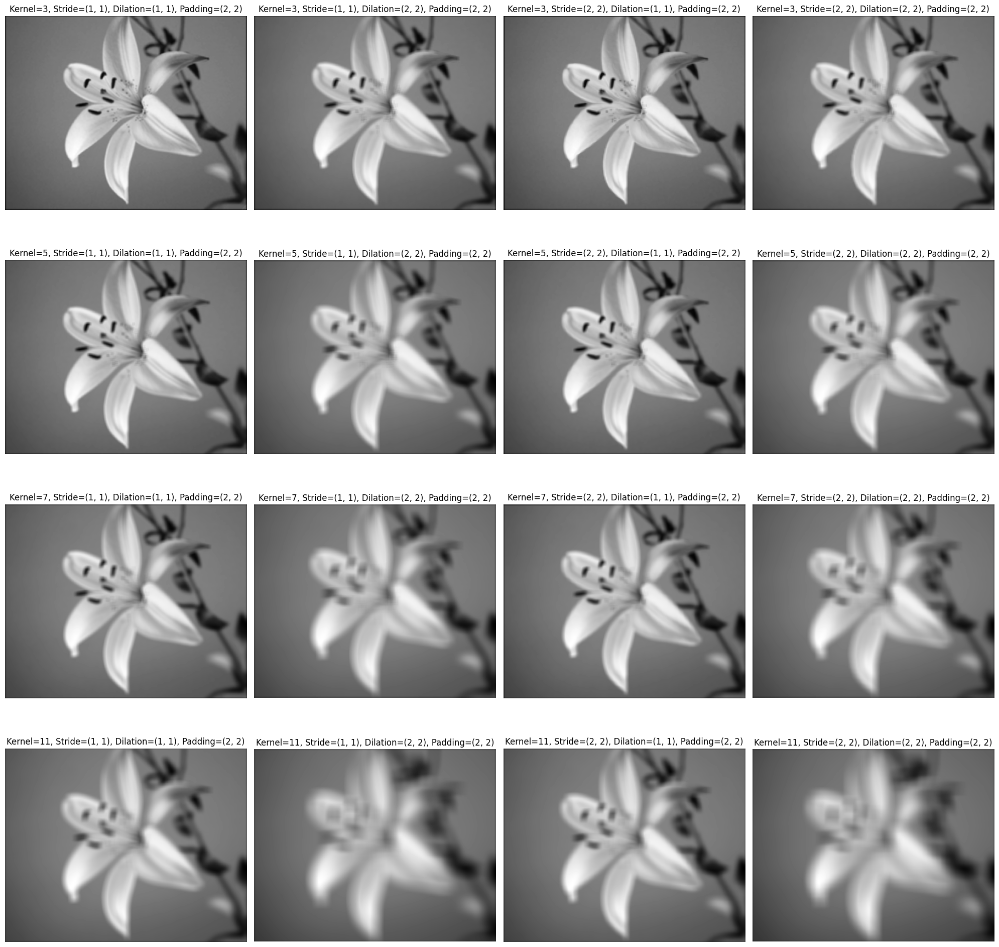

In [ ]:
kernel_sizes = [3, 5, 7, 11]
strides = [(1, 1), (2, 2)]
dilations = [(1, 1), (2, 2)]
paddings = [(1, 1), (2, 2)]

# Number of subplots
num_kernels = len(kernel_sizes)
num_strides = len(strides)
num_dilations = len(dilations)
num_paddings = len(paddings)

# Adjust figure size
fig, axes = plt.subplots(num_kernels, num_strides * num_dilations, figsize=(20, 20))

for ki, kernel_size in enumerate(kernel_sizes):
    for si, stride in enumerate(strides):
        for di, dilation in enumerate(dilations):
            for pi, padding in enumerate(paddings):
                kernel = np.ones((kernel_size, kernel_size)) * 1/(kernel_size*kernel_size)
                filtered_im = Conv2D(img, kernel=kernel, stride=stride, dilation=dilation, padding=padding)

                # Calculate subplot index
                subplot_index = si * num_dilations + di  # dont add the +1 to keep index within bounds

                # Plotting
                ax = axes[ki, subplot_index]
                ax.imshow(filtered_im, cmap='gray')
                ax.set_title(f'Kernel={kernel_size}, Stride={stride}, Dilation={dilation}, Padding={padding}')
                ax.axis('off')

plt.tight_layout()
plt.show()

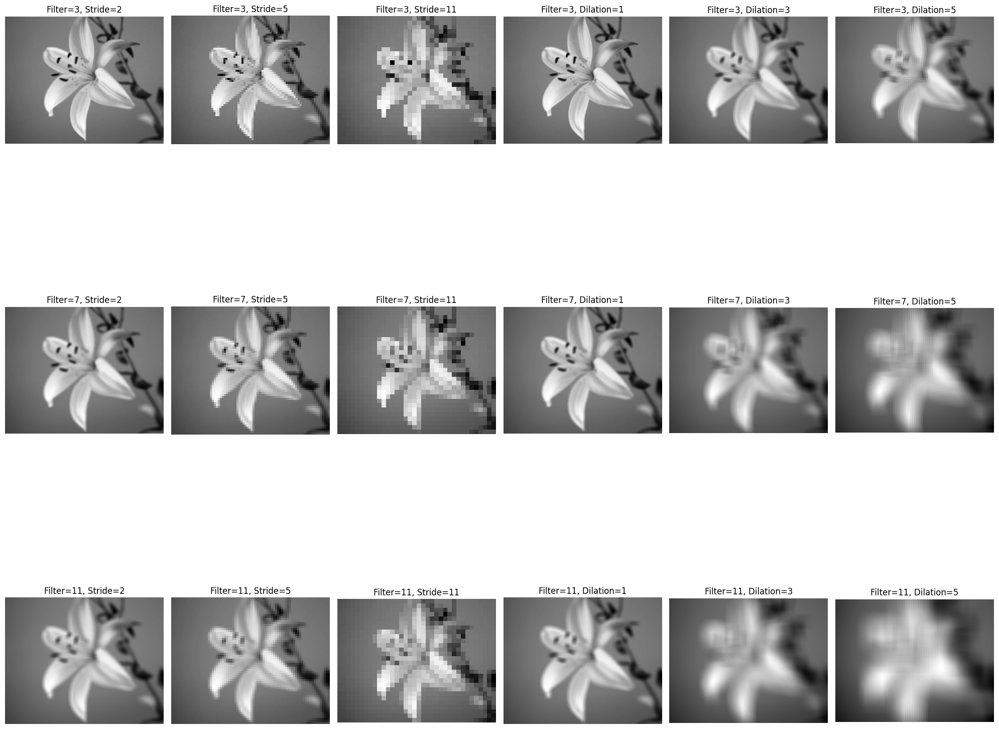

In [ ]:

kernel_sizes = [3, 7, 11]
strides = [2, 5, 11]
dilatations = [1, 3, 5]

# Adjust figure size
fig, axes = plt.subplots(len(kernel_sizes), len(strides) + len(dilatations), figsize=(20, 20))

# Iterate through filter sizes
for i, filter_size in enumerate(kernel_sizes):
    # Apply stride alone
    for j, stride in enumerate(strides):
        kernel = np.ones((filter_size, filter_size)) * 1/(filter_size*filter_size)
        filtered_im = Conv2D(img, kernel=kernel, stride=(stride, stride))
        ax = axes[i, j]
        ax.imshow(filtered_im, cmap='gray')
        ax.set_title(f'Filter={filter_size}, Stride={stride}')
        ax.axis('off')

    # Apply dilation alone
    for k, dilation in enumerate(dilatations):
        kernel = np.ones((filter_size, filter_size)) * 1/(filter_size*filter_size)
        filtered_im = Conv2D(img, kernel=kernel, dilation=(dilation, dilation))
        ax = axes[i, len(strides) + k]
        ax.imshow(filtered_im, cmap='gray')
        ax.set_title(f'Filter={filter_size}, Dilation={dilation}')
        ax.axis('off')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'K = 17')

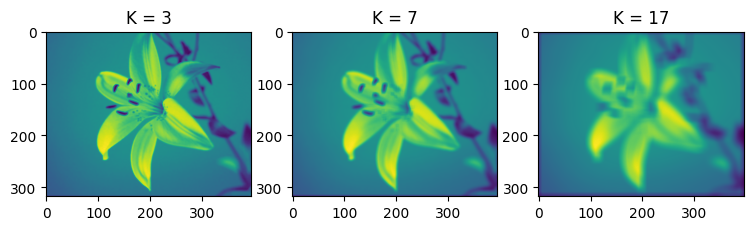

In [ ]:
#plotting the images after applying 2D convolution on the image flower with different values of size with default striding, dilatation and adding padding

fig, axs = plt.subplots(1, 3, figsize=(9, 3))
axs[0].imshow(tools.Conv2D(tools.add_padding(gray_image, ((K1-1)//2, (K1-1)//2)), kernel1))
axs[0].set_title(f'K = {K1}')


axs[1].imshow(tools.Conv2D(tools.add_padding(gray_image, ((K2-1)//2, (K2-1)//2)), kernel2))
axs[1].set_title(f'K = {K2}')


axs[2].imshow(tools.Conv2D(tools.add_padding(gray_image, ((K3-1)//2, (K3-1)//2)), kernel3))
axs[2].set_title(f'K = {K3}')

Text(0.5, 1.0, 'K = 3\nstride = 1 dilatation = 5\nshape:(308, 386)')

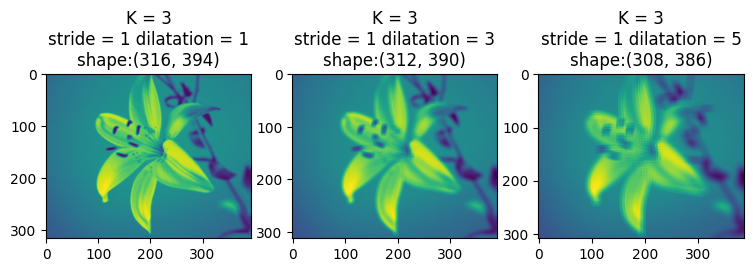

In [ ]:
#Apply stride( 2, 5, 11) and dilation (1 ,3 , 5 ) without padding

strides = [(1, 1), (2, 2), (5, 5), (11, 11)]
dilatations = [(1, 1), (3, 3), (5, 5)]

fig, axs = plt.subplots(1, 3, figsize=(9, 3))
axs[0].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[0], dilation=dilatations[0]))
axs[0].set_title( f'K = {K1}\nstride = {strides[0][0]} dilatation = {dilatations[0][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[0],dilation=dilatations[0]).shape}')

axs[1].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[0], dilation=dilatations[1]))
axs[1].set_title( f'K = {K1}\nstride = {strides[0][0]} dilatation = {dilatations[1][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[0],dilation=dilatations[1]).shape}')

axs[2].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[0], dilation=dilatations[2]))
axs[2].set_title(f'K = {K1}\nstride = {strides[0][0]} dilatation = {dilatations[2][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[0],dilation=dilatations[2]).shape}')


Text(0.5, 1.0, 'K = 3\nstride = 2 dilatation = 5\nshape:(154, 193)')

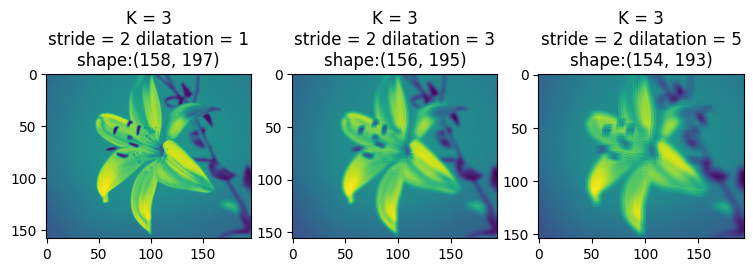

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(9, 3))
axs[0].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[1], dilation=dilatations[0]))
axs[0].set_title(f'K = {K1}\nstride = {strides[1][0]} dilatation = {dilatations[0][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[1],dilation=dilatations[0]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[0],dilation=dilatations[0])).shape)

axs[1].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[1], dilation=dilatations[1]))
axs[1].set_title(f'K = {K1}\nstride = {strides[1][0]} dilatation = {dilatations[1][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[1],dilation=dilatations[1]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[1],dilation=dilatations[1])).shape)

axs[2].imshow(tools.Conv2D(gray_image, kernel=kernel1,stride=strides[1], dilation=dilatations[2]))
axs[2].set_title(f'K = {K1}\nstride = {strides[1][0]} dilatation = {dilatations[2][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[1],dilation=dilatations[2]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[2],dilation=dilatations[2])).shape)




Text(0.5, 1.0, 'K = 17\nstride = 5 dilatation = 5\nshape:(62, 78)')

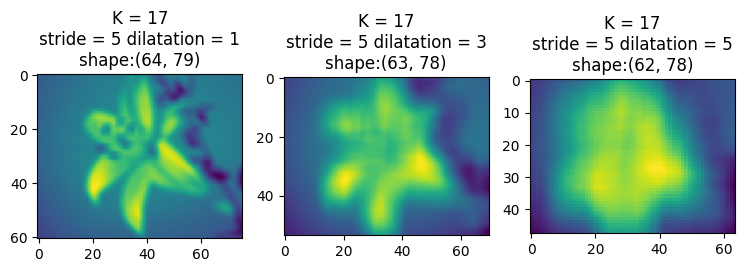

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(9, 3))
axs[0].imshow(tools.Conv2D(gray_image, kernel=kernel3,stride=strides[2], dilation=dilatations[0]))
axs[0].set_title(f'K = {K3}\nstride = {strides[2][0]} dilatation = {dilatations[0][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[2],dilation=dilatations[0]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[0],dilation=dilatations[0])).shape)

axs[1].imshow(tools.Conv2D(gray_image, kernel=kernel3,stride=strides[2], dilation=dilatations[1]))
axs[1].set_title(f'K = {K3}\nstride = {strides[2][0]} dilatation = {dilatations[1][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[2],dilation=dilatations[1]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[1],dilation=dilatations[1])).shape)

axs[2].imshow(tools.Conv2D(gray_image, kernel=kernel3,stride=strides[2], dilation=dilatations[2]))
axs[2].set_title(f'K = {K3}\nstride = {strides[2][0]} dilatation = {dilatations[2][0]}\nshape:{tools.Conv2D(gray_image,kernel=kernel1,stride=strides[2],dilation=dilatations[2]).shape}')
# print((tools.Conv2D(im_gray,kernel=kernel1,stride=strides[2],dilation=dilatations[2])).shape)

[[0.00493035 0.00572116 0.00642292 0.00697629 0.00733095 0.00745313
  0.00733095 0.00697629 0.00642292 0.00572116 0.00493035]
 [0.00572116 0.0066388  0.00745313 0.00809526 0.00850679 0.00864857
  0.00850679 0.00809526 0.00745313 0.0066388  0.00572116]
 [0.00642292 0.00745313 0.00836734 0.00908823 0.00955025 0.00970942
  0.00955025 0.00908823 0.00836734 0.00745313 0.00642292]
 [0.00697629 0.00809526 0.00908823 0.00987124 0.01037306 0.01054594
  0.01037306 0.00987124 0.00908823 0.00809526 0.00697629]
 [0.00733095 0.00850679 0.00955025 0.01037306 0.01090039 0.01108206
  0.01090039 0.01037306 0.00955025 0.00850679 0.00733095]
 [0.00745313 0.00864857 0.00970942 0.01054594 0.01108206 0.01126676
  0.01108206 0.01054594 0.00970942 0.00864857 0.00745313]
 [0.00733095 0.00850679 0.00955025 0.01037306 0.01090039 0.01108206
  0.01090039 0.01037306 0.00955025 0.00850679 0.00733095]
 [0.00697629 0.00809526 0.00908823 0.00987124 0.01037306 0.01054594
  0.01037306 0.00987124 0.00908823 0.00809526 0.00

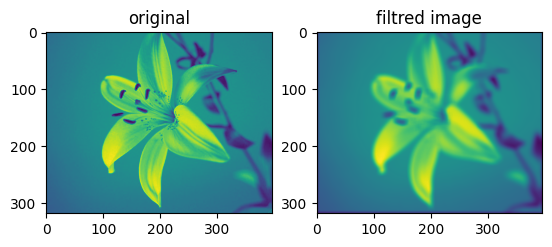

In [ ]:
#applying gaussian mask

#get gaussian mask of size 11
gauss = tools.gaussian_mask(size=11)
print(gauss)

#applying the mask on the gray image
filter_analysis(gray_image, kernel=gauss)


In [ ]:
#try on another image - loading the image
img_path = '/content/figs/dog.jpg'
img = io.imread(img_path)

#converting the image into gray scale
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


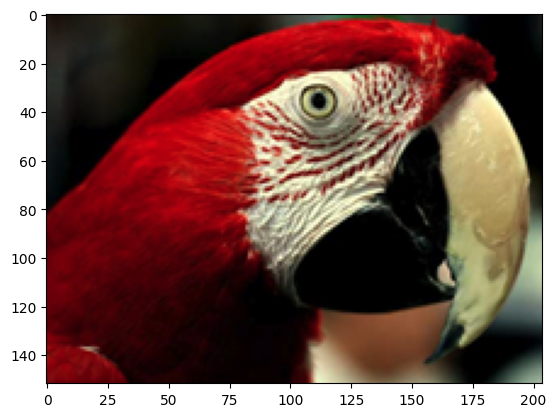

In [ ]:
#Refaire l’expérience précédente sur une image couleur
im_color = plt.imread("/content/figs/red_bird.png")
plt.imshow(im_color)

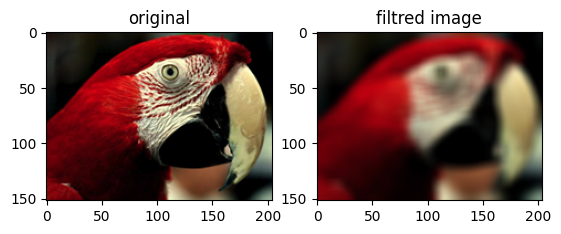

In [ ]:
filter_analysis_colored(im_color, kernel=gauss)

In [ ]:
gray_image  = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

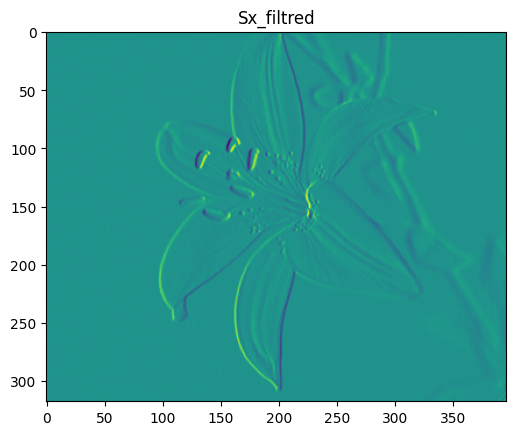

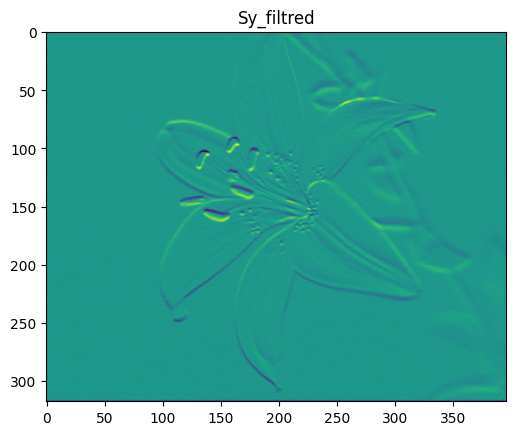

In [ ]:
#Appliquant le filter Sobel
#Construir les fonctions permettant de calculer : Gx = I ⊛ Sx et Gy = I ⊛ Sy
sobel_x = get_Gx(gray_image)
plot_img(sobel_x, 'Sx_filtred')

sobel_y = get_Gy(gray_image)
plot_img(sobel_y, 'Sy_filtred')

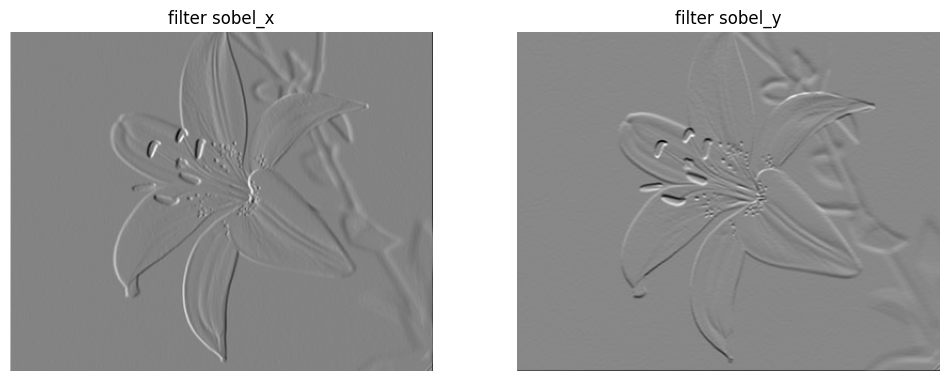

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(sobel_x, cmap='gray')
plt.title('filter sobel_x')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_y, cmap='gray')
plt.title('filter sobel_y')
plt.axis('off')
plt.show()

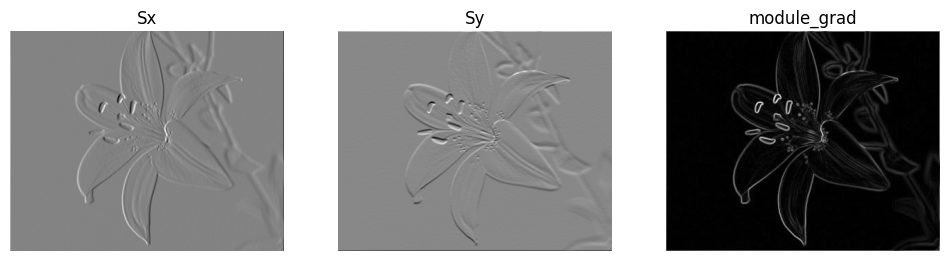

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(get_Gx(gray_image), cmap='gray')
plt.title('Sx')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(get_Gy(gray_image), cmap='gray')
plt.title('Sy')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(module_grad(gray_image), cmap='gray')
plt.title('module_grad')
plt.axis('off')
plt.show()

/content/my_functions_tp02.py:77: RuntimeWarning: divide by zero encountered in divide
  result=np.arctan(Gy/Gx)
/content/my_functions_tp02.py:77: RuntimeWarning: invalid value encountered in divide
  result=np.arctan(Gy/Gx)


(-0.5, 395.5, 317.5, -0.5)

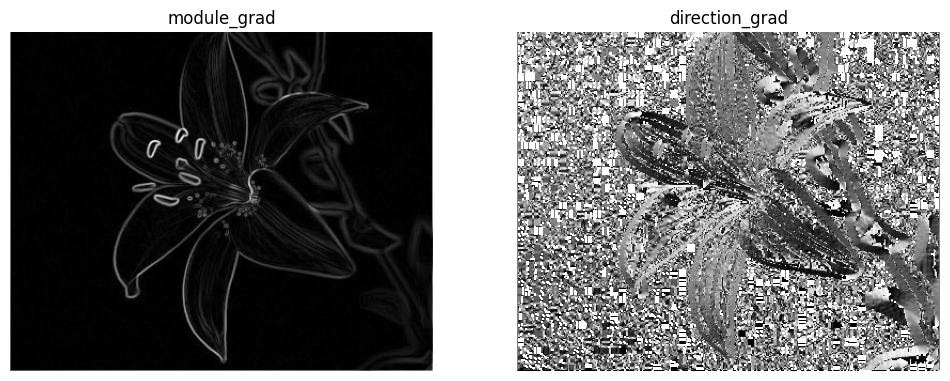

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(module_grad(gray_image), cmap='gray')
plt.title('module_grad')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(direct_grad(gray_image), cmap='gray')
plt.title('direction_grad')
plt.axis('off')

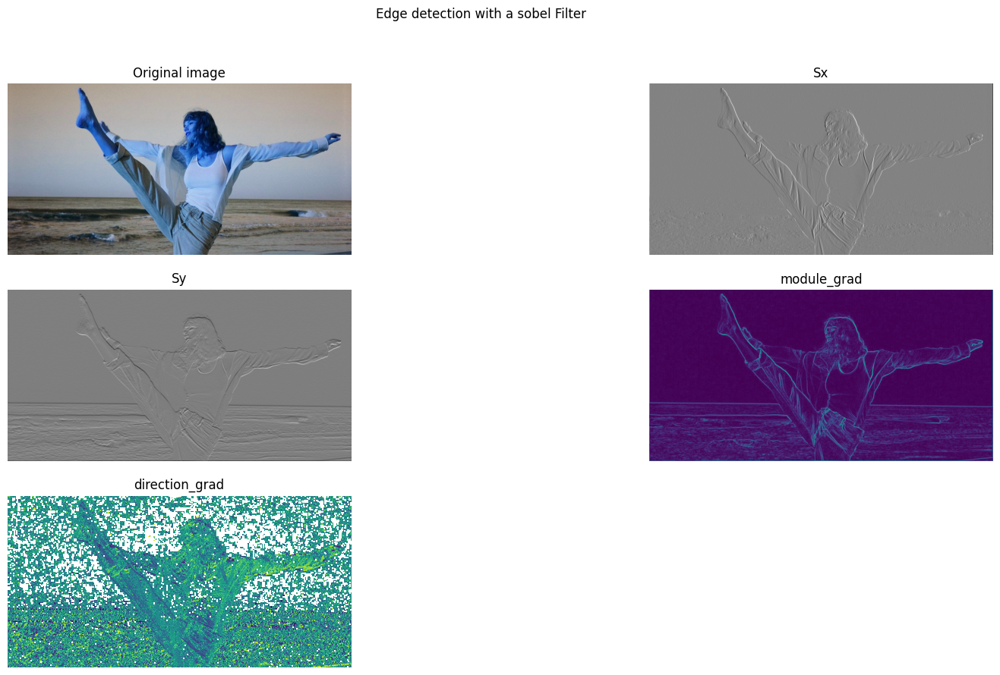

In [ ]:
#Edge detection with a sobel Filter
img=cv2.imread('/content/figs/TS.jpg')
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
sobel_x = get_Gx(gray_image)
sobel_y = get_Gy(gray_image)
module_gradient = module_grad(gray_image)
direction_gradient = direct_grad(gray_image)

#plotting the whole process
plt.figure(figsize=(20, 10))

plt.subplot(3, 2, 1)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sx')
plt.axis('off')

plt.subplot(3, 2, 3)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sy')
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(module_gradient)
plt.title('module_grad')
plt.axis('off')

plt.subplot(3, 2, 5)
plt.imshow(direction_gradient)
plt.title('direction_grad')
plt.axis('off')

plt.suptitle('Edge detection with a sobel Filter')
plt.show()





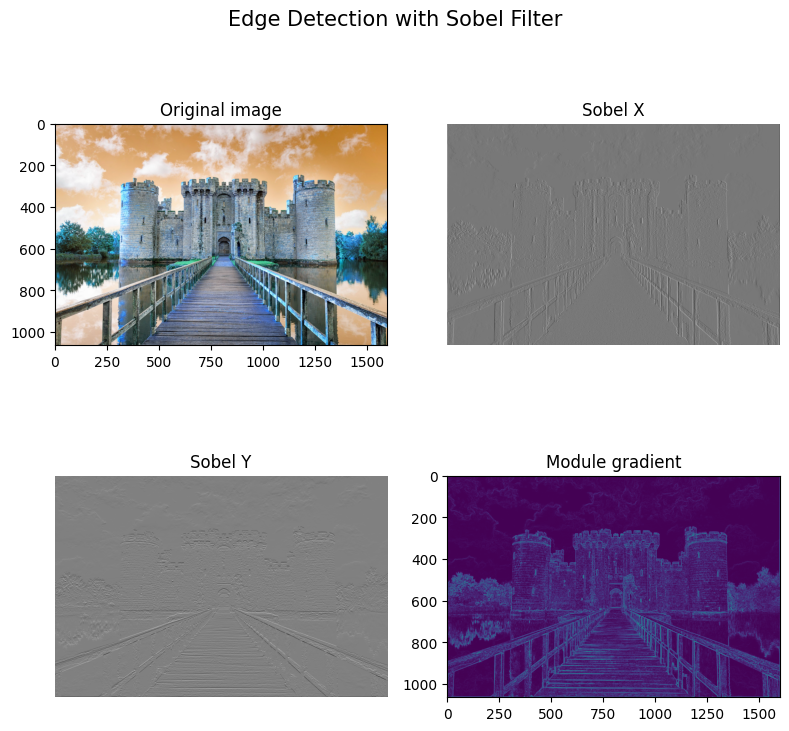

In [ ]:
img=cv2.imread('/content/figs/castle.jpg')
gimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
module_gradient = module_grad(gimg)
sobel_x = get_Gx(gimg)
sobel_y = get_Gy(gimg)
plt.figure(figsize=(8, 8))


# Plot original image
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("Original image")

plt.subplot(2, 2, 2)
plt.imshow(sobel_x, cmap="gray")
plt.title("Sobel X")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(sobel_y, cmap="gray")
plt.title("Sobel Y")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(module_gradient)
plt.title("Module gradient")

plt.suptitle("Edge Detection with Sobel Filter", fontsize=15)
plt.tight_layout()
plt.show()

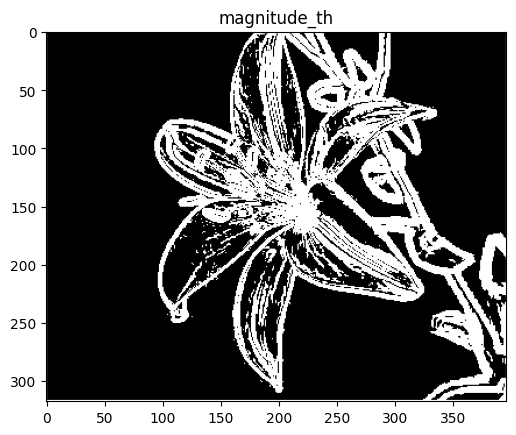

In [ ]:
#Applying detection filter with a threshold:
def _detection_filter(im_gray, th):
    g_mth = (module_grad(im_gray)) > th
    return g_mth


plot_img(_detection_filter(gray_image, th=25), 'magnitude_th')
plt.imshow(_detection_filter(gray_image, th=30), cmap='gray')

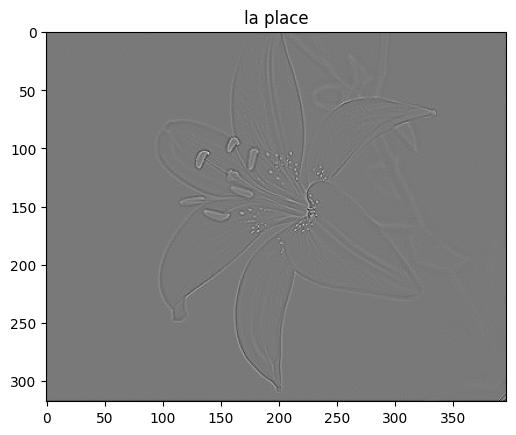

In [ ]:
# laplacian:
plot_img(get_L(gray_image), 'la place')
plt.imshow(get_L(gray_image), cmap='gray')
# contour points


def detect_contours(LI, seuil):
    contours = np.zeros_like(LI, dtype=np.uint8)
    rows, cols = LI.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            max_val = np.max(LI[i-1:i+2, j-1:j+2])
            min_val = np.min(LI[i-1:i+2, j-1:j+2])
            if max_val > 0 and min_val < 0 and max_val - min_val > seuil:
                contours[i, j] = 255

    return contours


seuil = 30
contours = detect_contours(get_L(gray_image), seuil)


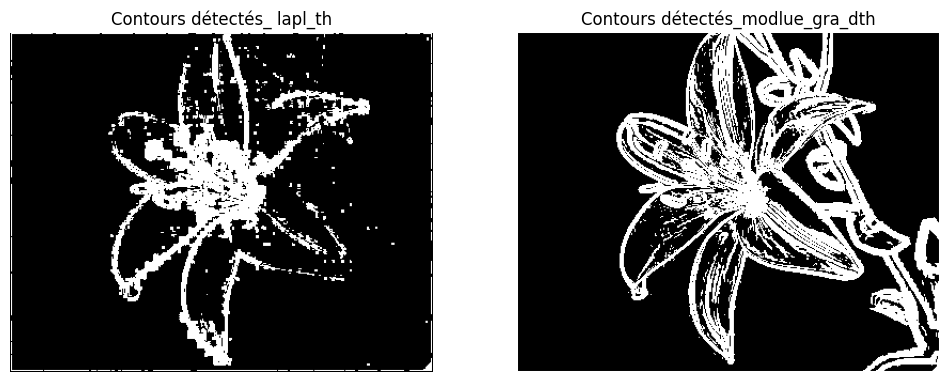

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(detect_contours(get_L(gray_image), seuil), cmap='gray')
plt.title('Contours détectés_ lapl_th')
plt.axis('off')  # Pour désactiver les axes
plt.subplot(1, 2, 2)
plt.imshow(_detection_filter(gray_image, seuil), cmap='gray')
plt.title('Contours détectés_modlue_gra_dth')
plt.axis('off')
plt.show()

# plt.subplot(1, 2, 2)
# plt.imshow(m.get_L(im_gray), cmap='gray')
# plt.title('Contours détectés__ lapl')
# plt.axis('off')
# plt.show()

Text(0.5, 1.0, ' Orientations ')

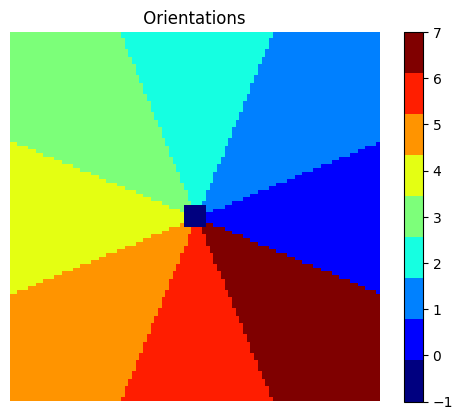

In [ ]:
bins = 8
cmap = tools.cmap_discretize('jet', bins+1)
ori_map = tools.orientation_colors()
plt.imshow(ori_map, cmap=cmap, vmin=-1, vmax=bins-1)
plt.colorbar()
plt.axis('off')
plt.title(" Orientations ")

Text(0.5, 1.0, 'Image Orientations without thresholding ')

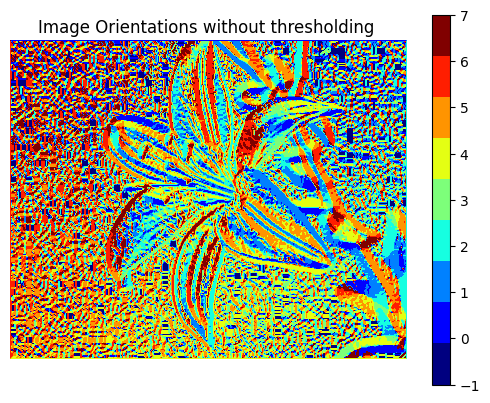

In [ ]:
bins = 8
cmap = tools.cmap_discretize('jet', bins + 1)
#ori_map = tools.orientation_colors()
g_x = get_Gx(gray_image)
g_y = get_Gy(gray_image)
#g_m=m.module_grad(im_gray)
g_m = module_grad(gray_image)
ori_map = tools.grad_orientation(g_x, g_y, g_m, b=8)
plt.imshow(ori_map, cmap=cmap, vmin=-1, vmax=bins-1)
plt.colorbar()
plt.axis('off')
plt.title("Image Orientations without thresholding ")

Text(0.5, 1.0, 'Image Orientations after thresholding ')

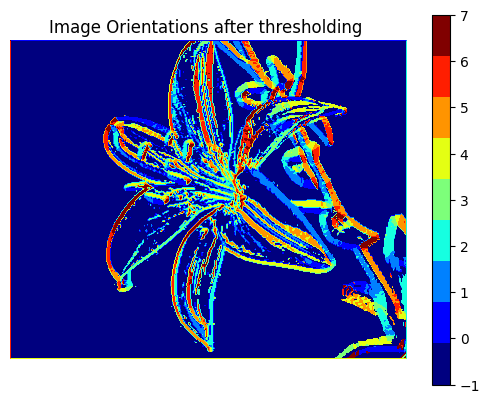

In [ ]:
#image orientation after thresholding
bins = 8
cmap = tools.cmap_discretize('jet', bins + 1)
#ori_map = tools.orientation_colors()
g_x = get_Gx(gray_image)
g_y = get_Gy(gray_image)
#g_m=m.module_grad(im_gray)
g_m = module_grad(gray_image) > 30
ori_map = tools.grad_orientation(g_x, g_y, g_m, b=8)
plt.imshow(ori_map, cmap=cmap, vmin=-1, vmax=bins-1)
plt.colorbar()
plt.axis('off')
plt.title("Image Orientations after thresholding ")

# **2 - Influence du lissage et suppression de non maxima**

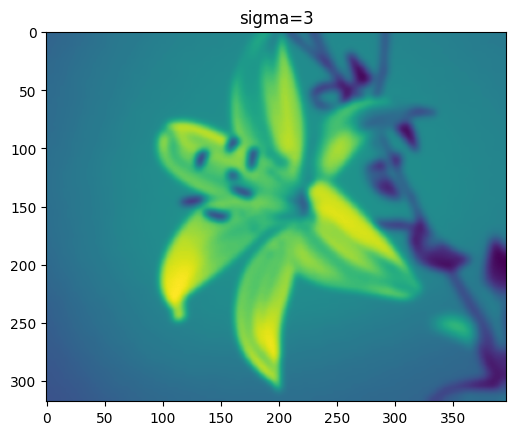

In [ ]:
#Applying lissage on the gray_image
from scipy import ndimage
blurred_img = ndimage.gaussian_filter(gray_image, sigma=3)
plot_img(blurred_img, 'sigma=3')
plt.imshow(ndimage.gaussian_filter(gray_image, sigma=3))

In [ ]:
def non_maximum_suppression(gradient_magnitude, gradient_direction):
  """
    Apply Non-Maximum Suppression to the gradient magnitudes given the gradient directions.

    Parameters:
    gradient_magnitude (numpy.ndarray): The matrix of gradient magnitudes.
    gradient_direction (numpy.ndarray): The matrix of gradient directions in radians.

    Returns:
    numpy.ndarray: The image after Non-Maximum Suppression.
    """
  nms_img = np.zeros_like(gradient_magnitude, dtype=np.float32)
  rows, cols = gradient_magnitude.shape
  print(rows,cols)

  gradient_direction = np.rad2deg(gradient_direction)
  gradient_direction[gradient_direction < 0] += 180
  for i in range(1, rows - 1):
      for j in range(1, cols - 1):

        # Get the gradient direction for the current pixel
          angle = gradient_direction[i, j]
          magnitude = gradient_magnitude[i, j]


           # Suppress non-maxima
          if ((angle >= 0 and angle < 22.5) or (angle >= 157.5 and angle < 180)):
                neighbors = [gradient_magnitude[i, j-1], gradient_magnitude[i, j+1]]
          elif (angle >= 22.5 and angle < 67.5):
                neighbors = [gradient_magnitude[i-1, j+1], gradient_magnitude[i+1, j-1]]
          elif (angle >= 67.5 and angle < 112.5):
                neighbors = [gradient_magnitude[i-1, j], gradient_magnitude[i+1, j]]
          elif (angle >= 112.5 and angle < 157.5):
                neighbors = [gradient_magnitude[i-1, j-1], gradient_magnitude[i+1, j+1]]

          if magnitude >= max(neighbors):
                nms_img[i, j] = magnitude
          else:
                nms_img[i, j] = 0

  return nms_img

In [ ]:
gradient_x = ndimage.sobel(blurred_img, axis=0)
gradient_y = ndimage.sobel(blurred_img, axis=1)
gradient_magnitude: np.ndarray = np.sqrt(gradient_x**2 + gradient_y**2)
gradient_direction = np.arctan2(gradient_y, gradient_x)

In [ ]:
# Apply Non-Maximum Suppression
nms_result = non_maximum_suppression(gradient_magnitude, gradient_direction)


318 396


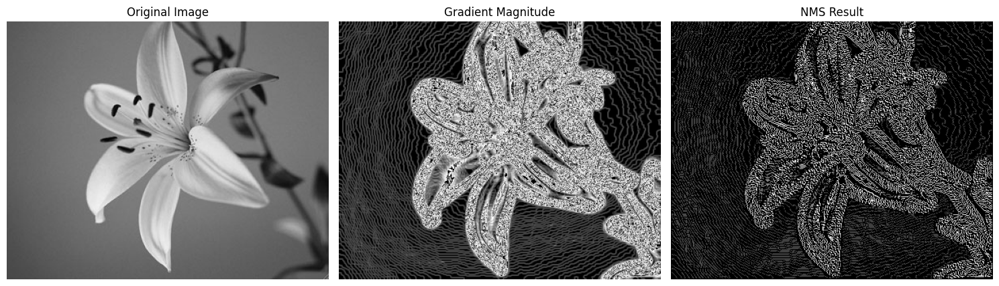

In [ ]:
# Plot the original gradient magnitudes and the NMS result
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axes[0].imshow(img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Gradient Magnitude
axes[1].imshow(gradient_magnitude, cmap='gray')
axes[1].set_title('Gradient Magnitude')
axes[1].axis('off')

# NMS Result
axes[2].imshow(nms_result, cmap='gray')
axes[2].set_title('NMS Result')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# **Observations:**
The gradient Magnitude image displays all detected edges with thickness due to some pixels having significant gradient value in the image while the Nms result image shows less thicker, more thinner and precise edges where only max values of gradient direction are preserved, effictevly sharpning the contour lines and deleting less significant gradient values.



## ** Apply Smoothing in the image before the NMS for different sigma values **

318 396
318 396
318 396


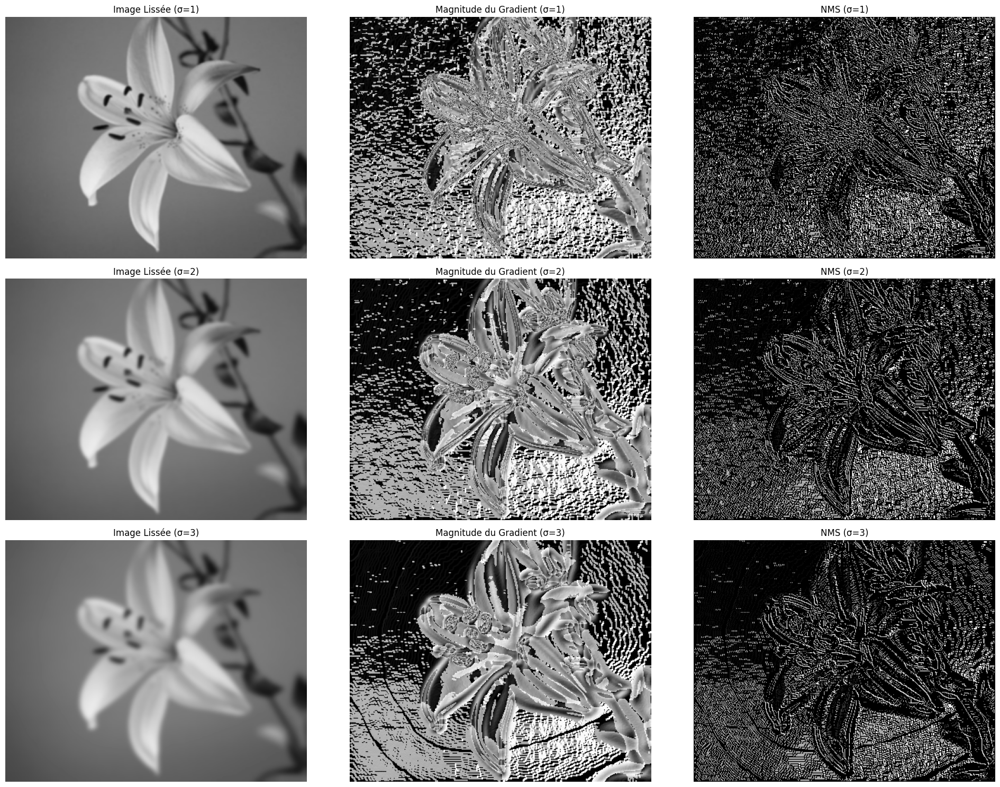

In [ ]:
# Values for sigma to apply the gaussian lissage
sigma_values = [1, 2, 3]

# plot the figure to compare the results
fig, axes = plt.subplots(len(sigma_values), 3, figsize=(20, 15))

for idx, sigma in enumerate(sigma_values):
    # Apply the gaussian smooth
    blurred_img = ndimage.gaussian_filter(img, sigma=sigma)

    # compute the gradients
    gradient_x = ndimage.sobel(blurred_img, axis=0)
    gradient_y = ndimage.sobel(blurred_img, axis=1)

    # Convert to grayscale if necessary before calculating gradient magnitude because the
    #NMS function takes only 2D np arrays

    if gradient_x.ndim == 3:
        gradient_x = np.mean(gradient_x, axis=2)
    if gradient_y.ndim == 3:
        gradient_y = np.mean(gradient_y, axis=2)
    gradient_magnitude: np.ndarray = np.sqrt(gradient_x**2 + gradient_y**2)
    gradient_direction = np.arctan2(gradient_y, gradient_x)

    # Apply NMS
    nms_result = non_maximum_suppression(gradient_magnitude, gradient_direction)

    # show the results
    axes[idx, 0].imshow(blurred_img, cmap='gray')
    axes[idx, 0].set_title(f'Image Lissée (σ={sigma})')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(gradient_magnitude, cmap='gray')
    axes[idx, 1].set_title(f'Magnitude du Gradient (σ={sigma})')
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(nms_result, cmap='gray')
    axes[idx, 2].set_title(f'NMS (σ={sigma})')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

#**Observations :**
                  

1.   **Gaussian Smoothing:**

       *Low sigma value 😞 preserve more details and noise.

       *High sigma value 🙂 reduce the noise in the image but also can blur the contours and edges.

2.   **Gradient Magnitude:**

     *Gradients are strong 🐣 at the edges and clear but they may cotain more noise with low sigma value

     *with a high sigma value the gradients become more uniform and coherent but they lose fine details 🍉

3. **Non-maximum supression :**             
     
     *Edges are sharp with low sigma value and they contain a lot of noise. 🙂

     *the more we increase the value of smoothing, edges become more cleaner without noise surrounding, they may be blurier. ⏹

#**Conclusion :**  
the smoothing operation can help us effectively to find edges more clearer by adjusting the sigma value, one can find balance between noise reduction and detail preservation, thus improving the overall quality of edge detection.  


      
